In [3]:
# # Sandbox calcs from lecture!
# import numpy as np
# from sklearn.preprocessing import StandardScaler
# from sklearn.decomposition import PCA
# from matplotlib import pyplot as plt
# %matplotlib inline

# x = np.array([[14,12.6],[26,26.6],[36.3,33.3],[2.5,3.6],[15,17.4],[8,11]])
# x = np.array([[1,0,0],[0,1,0],[1,0,0],[0,0,1],[0,1,0],[0,1,0]])
# print(x)
# plt.plot(x[:,0],x[:,1],'.')

# pcaobj = PCA(n_components=2)
# x_new = pcaobj.fit_transform(x)
# print(x_new)
# print(pcaobj.components_)

# x = StandardScaler(with_std=False).fit_transform(x)
# print(x)
# x_cov = np.cov(x.T)
# print(x_cov)
# eigenvalues, eigenvectors = np.linalg.eig(x_cov)
# print (eigenvectors, eigenvalues)


# Dimensionality Reduction with a Simple Dataset
Here we are going to start with the iris dataset. This is a very simple dataset that is four dimensions. Details about this data are rampant on the web. 
- Here is a good explanation from UCI: https://archive.ics.uci.edu/ml/datasets/Iris 
- And even more details from Wikipedia: http://en.wikipedia.org/wiki/Iris_flower_data_set 

Let's get started. We will use scikit for this analysis, which has a built-in loading mechanism for the iris dataset.

## Dependencies
- `jupyter labextension install @jupyter-widgets/jupyterlab-manager`

In [4]:
from sklearn import datasets as ds

iris = ds.load_iris() # wow that was simple to load up!

print (iris["DESCR"]) # a description of the dataset

.. _iris_dataset:

Iris plants dataset
--------------------

**Data Set Characteristics:**

    :Number of Instances: 150 (50 in each of three classes)
    :Number of Attributes: 4 numeric, predictive attributes and the class
    :Attribute Information:
        - sepal length in cm
        - sepal width in cm
        - petal length in cm
        - petal width in cm
        - class:
                - Iris-Setosa
                - Iris-Versicolour
                - Iris-Virginica
                
    :Summary Statistics:

    ============== ==== ==== ======= ===== ====================
                    Min  Max   Mean    SD   Class Correlation
    ============== ==== ==== ======= ===== ====================
    sepal length:   4.3  7.9   5.84   0.83    0.7826
    sepal width:    2.0  4.4   3.05   0.43   -0.4194
    petal length:   1.0  6.9   3.76   1.76    0.9490  (high!)
    petal width:    0.1  2.5   1.20   0.76    0.9565  (high!)
    ============== ==== ==== ======= ===== ===========

In [5]:
# let's convert it to a pandas data frame and visualize it
import pandas as pd
import numpy as np

df = pd.DataFrame(iris.data,columns=iris.feature_names)
# add in the class targets and names
df['target'] = iris.target.astype(np.int)
print (df.info())
df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150 entries, 0 to 149
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   sepal length (cm)  150 non-null    float64
 1   sepal width (cm)   150 non-null    float64
 2   petal length (cm)  150 non-null    float64
 3   petal width (cm)   150 non-null    float64
 4   target             150 non-null    int32  
dtypes: float64(4), int32(1)
memory usage: 5.4 KB
None


C:\Users\wisni\AppData\Local\Temp\ipykernel_7700\4024548811.py:7: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  df['target'] = iris.target.astype(np.int)


,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),target
0,5.1,3.5,1.4,0.2,0
1,4.9,3.0,1.4,0.2,0
2,4.7,3.2,1.3,0.2,0
3,4.6,3.1,1.5,0.2,0
4,5.0,3.6,1.4,0.2,0


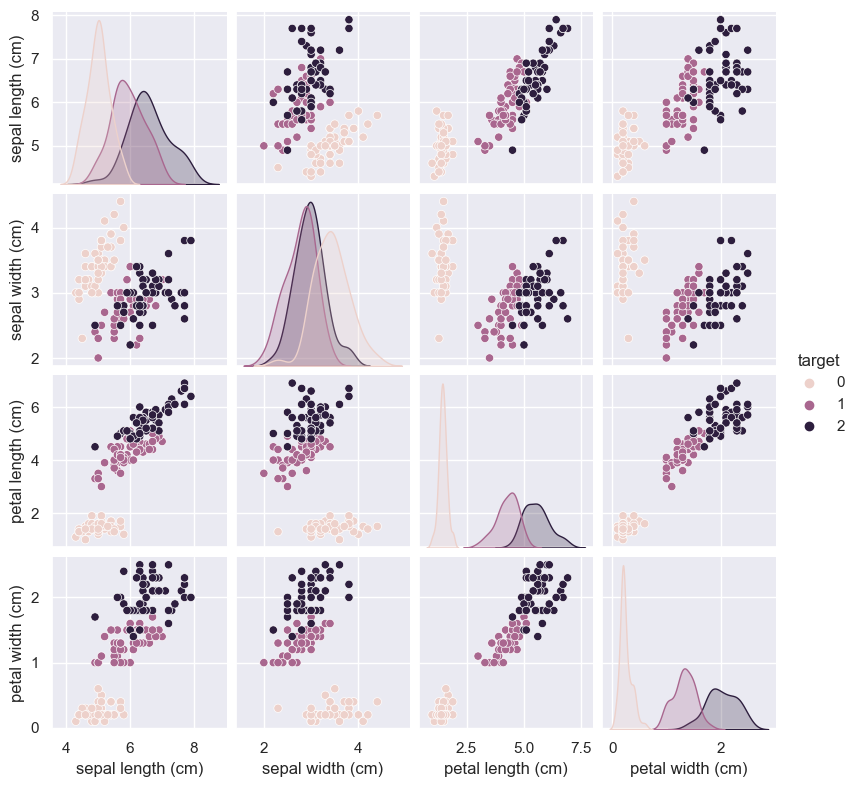

In [6]:
%matplotlib inline
from matplotlib import pyplot as plt
import seaborn as sns

sns.set()
sns.pairplot(df, hue="target", height=2)

## Using PCA with sklearn
Now let's use PCA to find the two "best" dimensions of this data
These are linear transforms to help project the features into something more understandable

In [7]:
from sklearn.decomposition import PCA

X = iris.data
y = iris.target
target_names = iris.target_names

pca = PCA(n_components=2)
pca.fit(X) # fit data and then transform it
X_pca = pca.transform(X)

# print the components

print ('pca:', pca.components_)

pca: [[ 0.36138659 -0.08452251  0.85667061  0.3582892 ]
 [ 0.65658877  0.73016143 -0.17337266 -0.07548102]]


Text(0, 0.5, '0.66*sepal length +0.73*sepal width -0.17*petal length -0.08*petal width ')

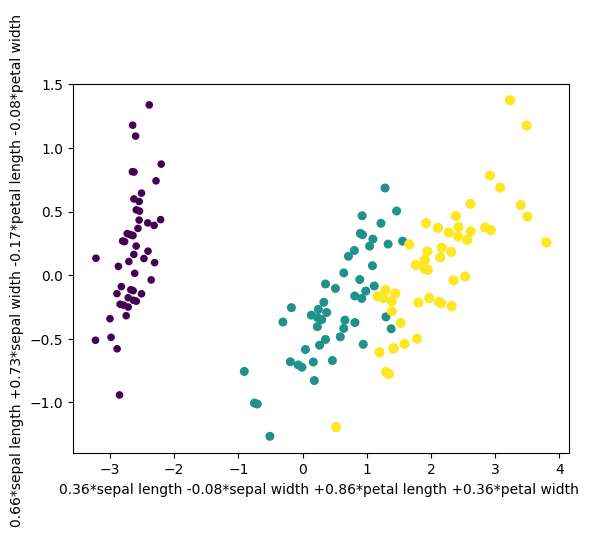

In [8]:
import seaborn as sns
cmap = sns.set(style="darkgrid") 

# this function definition just formats the weights into readable strings
# you can skip it without loss of generality to the Data Science content
def get_feature_names_from_weights(weights, names):
    tmp_array = []
    for comp in weights:
        tmp_string = ''
        for fidx,f in enumerate(names):
            if fidx>0 and comp[fidx]>=0:
                tmp_string+='+'
            tmp_string += '%.2f*%s ' % (comp[fidx],f[:-5])
        tmp_array.append(tmp_string)
    return tmp_array
  
plt.style.use('default')
# now let's get to the Data Analytics!
pca_weight_strings = get_feature_names_from_weights(pca.components_, iris.feature_names) 

# create some pandas dataframes from the transformed outputs
df_pca = pd.DataFrame(X_pca,columns=[pca_weight_strings])

from matplotlib.pyplot import scatter

# scatter plot the output, with the names created from the weights
ax = scatter(X_pca[:,0], X_pca[:,1], c=y, s=(y+2)*10, cmap=cmap)
plt.xlabel(pca_weight_strings[0]) 
plt.ylabel(pca_weight_strings[1])


## Biplots 
Biplots are visualizations that allow you to see how much of each principle component is represented by each feature. They are used many times in survey data results to display the responses of multiple survey questions. An example biplots used in this fashion is available here: https://datasciencebe.files.wordpress.com/2015/03/pca-skillscores.png

![biplot](https://datasciencebe.files.wordpress.com/2015/03/pca-skillscores.png)

In [9]:
# Manipulated example from https://github.com/teddyroland/python-biplot/blob/master/biplot.py

def biplot(pca, dat, title=''):
    
    import plotly
    from plotly.graph_objs import Bar, Line
    from plotly.graph_objs import Scatter, Layout
    from plotly.graph_objs.scatter import Marker
    from plotly.graph_objs.layout import XAxis, YAxis
    plotly.offline.init_notebook_mode() # run at the start of every notebook
    
    # 0,1 denote PC1 and PC2; change values for other PCs
    xvector = pca.components_[0] 
    yvector = pca.components_[1]

    tmp = pca.transform(dat.values)
    xs = tmp[:,0] 
    ys = tmp[:,1]

    annotations = [Scatter(x=xs, y=ys, mode ='markers',
                           marker=Marker(color=iris.target),
                           name='PCA Trans. Data')]
    for i in range(len(xvector)):
        txt = list(dat.columns.values)[i]
        annotations.append(
                Scatter( 
                    x=[0, xvector[i]*max(xs)],
                    y=[0, yvector[i]*max(ys)],
                    mode='lines+text',
                    text=['', txt],
                    name=txt,
                ))
    
    plotly.offline.iplot({
        "data": annotations,
        "layout": Layout(xaxis=XAxis(title='Principal Component One'), 
                         yaxis=YAxis(title='Principal Component Two'),
                        title=title)
    })


    plt.show()
    
X = iris.data
pca = PCA(n_components=4)
pca.fit(X) 
biplot(pca,pd.DataFrame(iris.data,columns=iris.feature_names),'Iris Biplot')

## Explained Variance
Recall that the explained variance is a factor of the eigen values. We can access these via the following equation:

$$ r_q=\frac{\sum_{j=1}^q \lambda_j}{\sum_{\forall i} \lambda_i} $$

In [10]:
# manipulated from Sebastian Raschka Example (your book!)
# also from hi blog here: http://sebastianraschka.com/Articles/2015_pca_in_3_steps.html

# this is a scree plot
def plot_explained_variance(pca):
    import plotly
    from plotly.graph_objs import Bar, Line
    from plotly.graph_objs import Scatter, Layout
    from plotly.graph_objs.scatter import Marker
    from plotly.graph_objs.layout import XAxis, YAxis
    plotly.offline.init_notebook_mode() # run at the start of every notebook
    
    explained_var = pca.explained_variance_ratio_
    cum_var_exp = np.cumsum(explained_var)
    
    plotly.offline.iplot({
        "data": [Bar(y=explained_var, name='individual explained variance'),
                 Scatter(y=cum_var_exp, name='cumulative explained variance')
            ],
        "layout": Layout(xaxis=XAxis(title='Principal components'), yaxis=YAxis(title='Explained variance ratio'))
    })
        

pca = PCA(n_components=4)
X_pca = pca.fit(X)
plot_explained_variance(pca)

# PCA With Image Data
This is code manipulated from Olivier Grisel's eigen face classification demonstration. You can find the original notebook here: http://nbviewer.ipython.org/github/ogrisel/notebooks/blob/master/Labeled%20Faces%20in%20the%20Wild%20recognition.ipynb

In [11]:
# fetch the images for the dataset
# this will take a long time the first run because it needs to download
# after the first time, the dataset will be save to your disk (in sklearn package somewhere) 
# if this does not run, you may need additional libraries installed on your system (install at your own risk!!)
from sklearn.datasets import fetch_lfw_people

lfw_people = fetch_lfw_people()

In [13]:
# get some of the specifics of the dataset
X = lfw_people.data
y = lfw_people.target
names = lfw_people.target_names

n_samples, n_features = X.shape
_, h, w = lfw_people.images.shape
n_classes = len(names)

print(np.sum(~np.isfinite(X)))
print("n_samples: {}".format(n_samples))
print("n_features: {}".format(n_features))
print("n_classes: {}".format(n_classes))
print("Original Image Sizes {} by {}".format(h,w))
print (125*94) # the size of the images are the size of the feature vectors

0
n_samples: 13233
n_features: 2914
n_classes: 5749
Original Image Sizes 62 by 47
11750


So basically each feature vector is a giant image with the rows of the image just stacked one after the other into a giant vector. The image sizes are 125 pixels by 94 pixels. This gives us 125x94=11750 pixels per image.

So we are using each pixel location in the image as a separate feature. Wow. That's a lot of features. The process is as follows:

<img src="https://i.ytimg.com/vi/_lY74pXWlS8/maxresdefault.jpg" alt="Drawing" width="500"/>

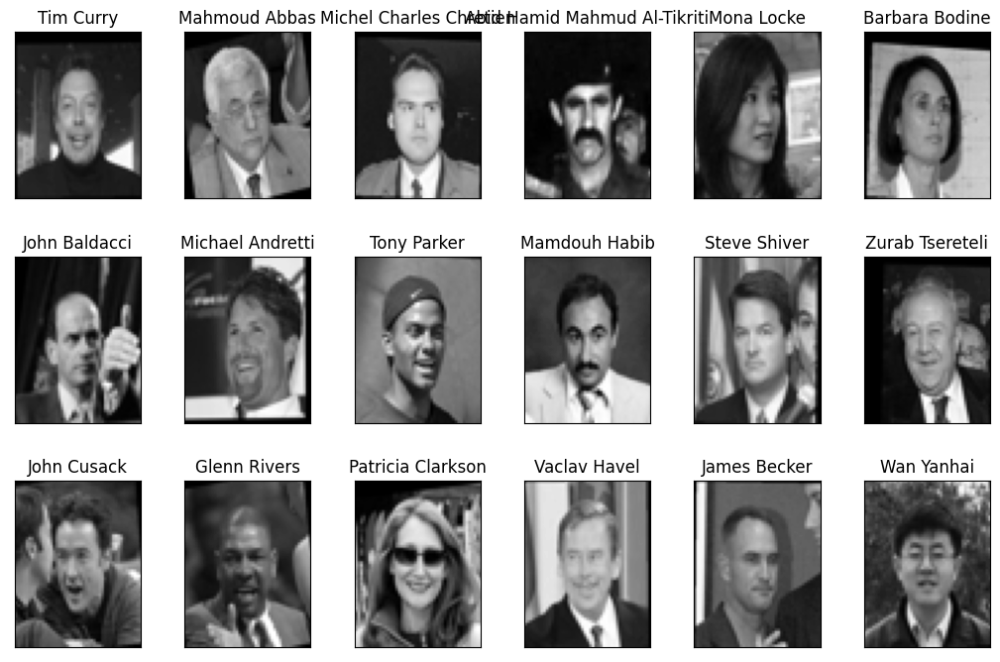

In [14]:
# a helper plotting function
def plot_gallery(images, titles, h, w, n_row=3, n_col=6):
    """Helper function to plot a gallery of portraits"""
    plt.figure(figsize=(1.7 * n_col, 2.3 * n_row))
    plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.35)
    for i in range(n_row * n_col):
        plt.subplot(n_row, n_col, i + 1)
        plt.imshow(images[i].reshape((h, w)), cmap=plt.cm.gray)
        plt.title(titles[i], size=12)
        plt.xticks(())
        plt.yticks(())

plot_gallery(X, names[y], h, w) # defaults to showing a 3 by 6 subset of the faces

## Reconstruct Using Full PCA


In [13]:
# lets do some PCA of the features and go from 1850 features to 20 features
from sklearn.decomposition import PCA

n_components = 300
print ("Extracting the top %d eigenfaces from %d faces" % (
    n_components, X.shape[0]))

pca = PCA(n_components=n_components)
%time pca.fit(X.copy())
eigenfaces = pca.components_.reshape((n_components, h, w))

Extracting the top 300 eigenfaces from 13233 faces
CPU times: total: 11.3 s
Wall time: 1.55 s


In [14]:
plot_explained_variance(pca)

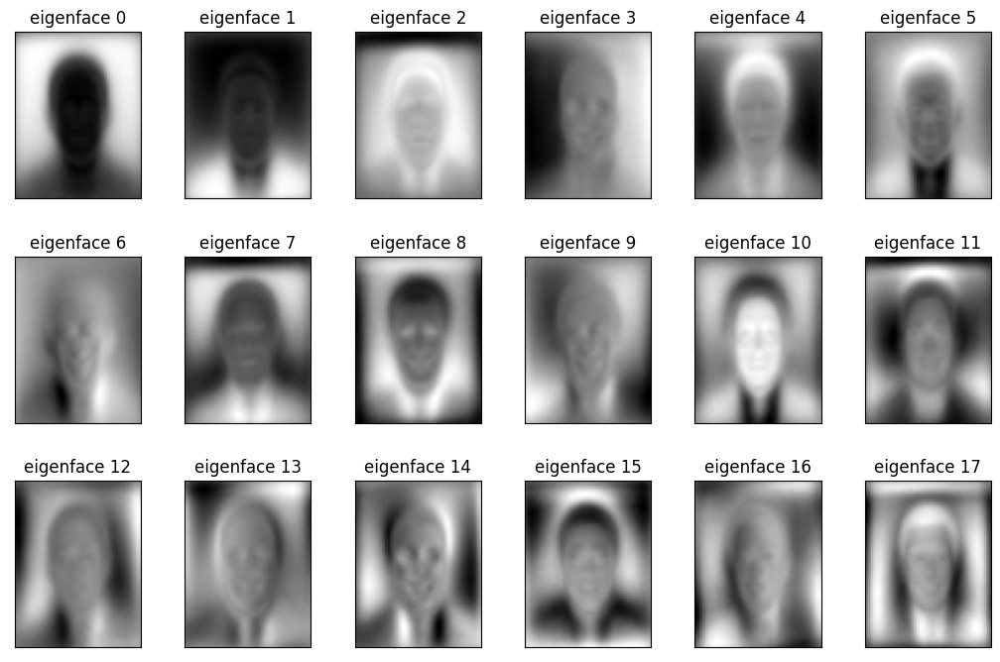

In [15]:
eigenface_titles = ["eigenface %d" % i for i in range(eigenfaces.shape[0])]
plot_gallery(eigenfaces, eigenface_titles, h, w)

In [16]:
def reconstruct_image(trans_obj,org_features):
    low_rep = trans_obj.transform(org_features)
    rec_image = trans_obj.inverse_transform(low_rep)
    return low_rep, rec_image
    
idx_to_reconstruct = 1    
X_idx = X[idx_to_reconstruct]
low_dimensional_representation, reconstructed_image = reconstruct_image(pca,X_idx.reshape(1, -1))

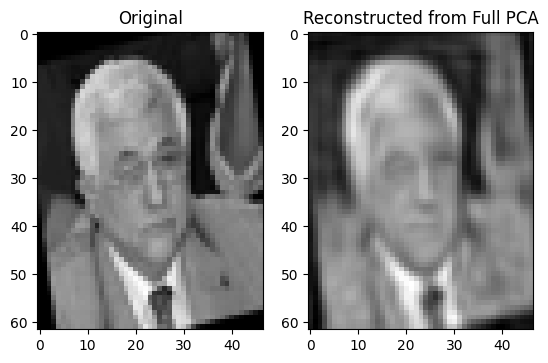

In [17]:
plt.subplot(1,2,1)
plt.imshow(X_idx.reshape((h, w)), cmap=plt.cm.gray)
plt.title('Original')
plt.grid(False)
plt.subplot(1,2,2)
plt.imshow(reconstructed_image.reshape((h, w)), cmap=plt.cm.gray)
plt.title('Reconstructed from Full PCA')
plt.grid(False)

## Now Let's Use Randomized PCA
Of course, the methods that are used to calculate eigenvectors (the components) do not scale well with the number of features (in this case, the image dimensions). Recall that PCA works on the covariance matrix and the covariance matrix size is not affected by the number of examples, only the number of features. Randomized PCA helps to mitigate this by formulating the eigenvectors of a lower rank matrix using randomized projections. 

More information here: 
- http://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html
- ftp://ftp.math.ucla.edu/pub/camreport/cam08-60.pdf
- Halko, et al., 2009 (arXiv:909) A randomized algorithm for the decomposition of matrices Per-Gunnar Martinsson, Vladimir Rokhlin and Mark Tygert

In [18]:
# lets do some PCA of the features and go from 1850 features to 300 features

n_components = 300
print ("Extracting the top %d eigenfaces from %d faces" % (
    n_components, X.shape[0]))

rpca = PCA(n_components=n_components, svd_solver='randomized')
%time rpca.fit(X.copy())
eigenfaces = rpca.components_.reshape((n_components, h, w))

Extracting the top 300 eigenfaces from 13233 faces
CPU times: total: 11 s
Wall time: 1.5 s


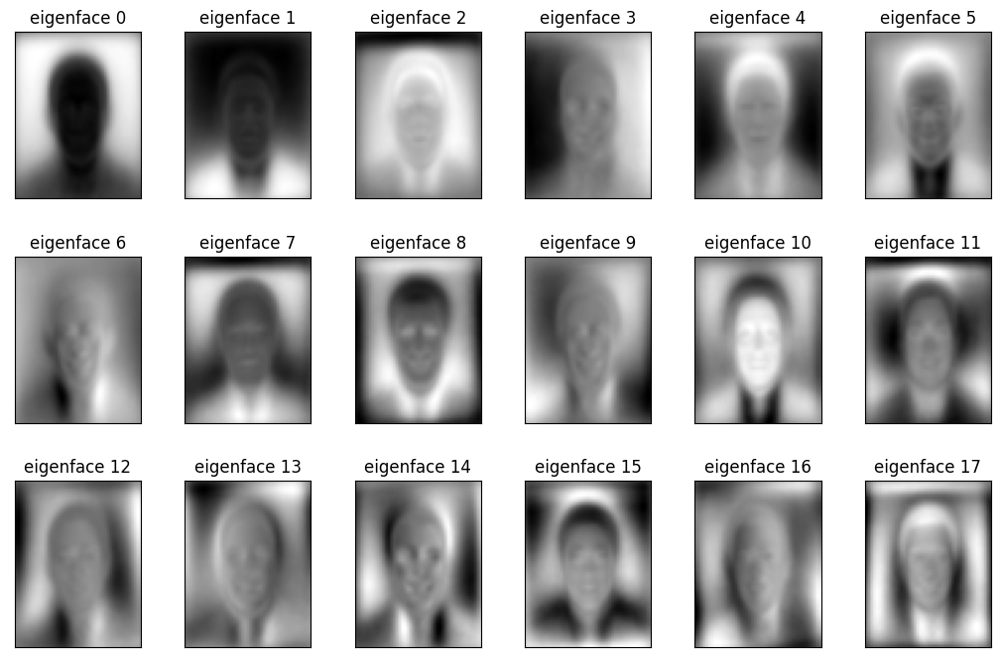

In [19]:
eigenface_titles = ["eigenface %d" % i for i in range(eigenfaces.shape[0])]
plot_gallery(eigenfaces, eigenface_titles, h, w)

In [20]:
# widgets example
from ipywidgets import widgets  # make this interactive!

widgets.interact(lambda x: print(x),x=(0,5,1))

interactive(children=(IntSlider(value=2, description='x', max=5), Output()), _dom_classes=('widget-interact',)…

<function __main__.<lambda>(x)>

In [21]:
import warnings
# warnings.simplefilter('ignore', DeprecationWarning)
# warnings.simplefilter("always",DeprecationWarning)



def plt_reconstruct(idx_to_reconstruct):
    # this code is for reference only, it does not qualify as a neaarest neighbor search
    #  for your lab project. 
    idx_to_reconstruct = np.round(idx_to_reconstruct)
    
    x_flat = X[idx_to_reconstruct].reshape(1, -1)
    reconstructed_image = pca.inverse_transform(pca.transform(x_flat.copy()))    
    reconstructed_image_rpca = rpca.inverse_transform(rpca.transform(x_flat.copy()))
    
    plt.figure(figsize=(15,7))
    
    plt.subplot(1,3,1) # original
    plt.imshow(x_flat.reshape((h, w)), cmap=plt.cm.gray)
    plt.title(names[y[idx_to_reconstruct]]+f", {x_flat.shape[1]} elements")
    plt.grid(False)
    
    plt.subplot(1,3,2) # pca
    plt.imshow(reconstructed_image.reshape((h, w)), cmap=plt.cm.gray)
    plt.title(f"Full PCA, {n_components} elements")
    plt.grid(False)
    
    plt.subplot(1,3,3) # randomized pca
    plt.imshow(reconstructed_image_rpca.reshape((h, w)), cmap=plt.cm.gray)
    plt.title(f"Randomized PCA, {n_components} elements")
    plt.grid(False)
    
    
    
widgets.interact(plt_reconstruct,idx_to_reconstruct=(0,n_samples-1,1),__manual=True)

interactive(children=(IntSlider(value=6616, description='idx_to_reconstruct', max=13232), Output()), _dom_clas…

<function __main__.plt_reconstruct(idx_to_reconstruct)>

## PCA For Image Classification

In [22]:
from ipywidgets import fixed
import copy

from sklearn.metrics.pairwise import pairwise_distances
# find the pairwise distance between all the different image features

X_pca_features = rpca.transform(copy.deepcopy(X))
dist_matrix_pca = pairwise_distances(copy.deepcopy(X_pca_features),
                                     metric="seuclidean")

                                       
# put it together inside a nice widget
def closest_image(dmat_pca, idx1):
    
    # NOTE: this will NOT suffice for evaluation of a nearest neighbor classifier for your lab assignment
    distances = copy.deepcopy(dmat_pca[idx1,:]) # get all image distances
    distances[idx1] = np.infty # dont pick the same image!
    idx2 = np.argmin(distances) #pca
    
    distances[idx2] = np.infty # dont pick the same image!
    idx3 = np.argmin(distances) # pixels
    
    plt.figure(figsize=(10,16))
    plt.subplot(1,3,1)
    plt.imshow(X[idx1].reshape((h,w)),cmap=plt.cm.gray)
    plt.title("Original:"+names[y[idx1]])
    plt.grid(False)

    plt.subplot(1,3,2)
    plt.imshow(X[idx2].reshape((h,w)),cmap=plt.cm.gray)
    plt.title("Closest:"+names[y[idx2]])
    plt.grid(False)
    
    plt.subplot(1,3,3)
    plt.imshow(X[idx3].reshape((h,w)),cmap=plt.cm.gray)
    plt.title("Next Closest:"+names[y[idx3]])
    plt.grid(False)
    
widgets.interact(closest_image,idx1=(0,n_samples-1,1),
                 dmat_pca=fixed(dist_matrix_pca),
                 __manual=True)

interactive(children=(IntSlider(value=6616, description='idx1', max=13232), Output()), _dom_classes=('widget-i…

<function __main__.closest_image(dmat_pca, idx1)>

____
# Image Processing Crash Course
Now let's look at other Methods for extracting features from images.

Let's start by calculating gradients:

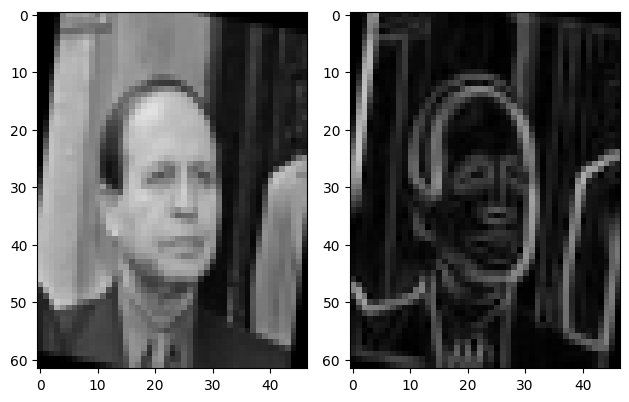

In [23]:
from skimage.io import imshow
from skimage.filters import sobel_h, sobel_v

plt.subplot(1,2,1)
idx_to_reconstruct = int(np.random.rand(1)*len(X))
img  = X[idx_to_reconstruct].reshape((h,w))
imshow(img)
plt.grid(False)


plt.subplot(1,2,2)
gradient_mag = np.sqrt(sobel_v(img)**2 + sobel_h(img)**2 ) 
imshow(gradient_mag)
plt.grid(False)

## Image Feature: DAISY Bag of Features Model
As discussed in lecture, DAISY Features are a means of looking at histograms of edges weights using gradients at various orientations (if you are new to this, that is not a satisfying explanation, please look back at the notes/slides for the course.). 

http://scikit-image.org/docs/dev/_images/sphx_glr_plot_daisy_001.png

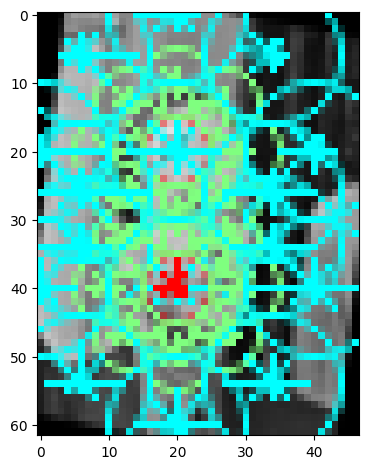

In [24]:
from skimage.feature import daisy

# lets first visualize what the daisy descriptor looks like
features, img_desc = daisy(img, 
                           step=20, 
                           radius=20, 
                           rings=2, 
                           histograms=8, 
                           orientations=8, 
                           visualize=True)
imshow(img_desc)
plt.grid(False)

In [25]:
# now let's understand how to use it
features = daisy(img, step=20, radius=20, rings=2, histograms=8, orientations=4, visualize=False)
print(features.shape)
print(features.shape[0]*features.shape[1]*features.shape[2])

(2, 1, 68)
136


In [30]:
# create a function to tak in the row of the matric and return a new feature
def apply_daisy(row,shape):
    feat = daisy(row.reshape(shape), step=20, radius=20, 
                 rings=2, histograms=8, orientations=4, 
                 visualize=False)
    return feat.reshape((-1))

%time test_feature = apply_daisy(X[3],(h,w))
test_feature.shape

CPU times: user 10.2 ms, sys: 1.34 ms, total: 11.6 ms
Wall time: 10.5 ms


(1020,)

In [31]:
0.026 * len(X) # approximate how long it may run

78.598

In [32]:
# apply to entire data, row by row,
# takes about a minute to run
%time daisy_features = np.apply_along_axis(apply_daisy, 1, X, (h,w))
print(daisy_features.shape)

CPU times: user 29.3 s, sys: 1.03 s, total: 30.3 s
Wall time: 30.8 s
(3023, 1020)


In [33]:
from sklearn.metrics.pairwise import pairwise_distances
# find the pairwise distance between all the different image features
%time dist_matrix = pairwise_distances(daisy_features)

CPU times: user 506 ms, sys: 18.4 ms, total: 524 ms
Wall time: 162 ms


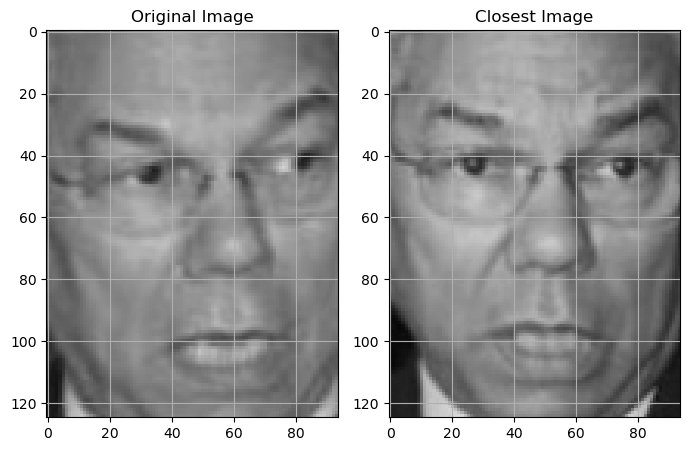

In [34]:
import copy
# find closest image to current image
idx1 = 5
distances = copy.deepcopy(dist_matrix[idx1,:])
distances[idx1] = np.infty # dont pick the same image!
idx2 = np.argmin(distances)

plt.figure(figsize=(7,10))
plt.subplot(1,2,1)
imshow(X[idx1].reshape((h,w)))
plt.title("Original Image")
plt.grid()

plt.subplot(1,2,2)
imshow(X[idx2].reshape((h,w)))
plt.title("Closest Image")
plt.grid()

In [35]:
from ipywidgets import fixed
# put it together inside a nice widget
def closest_image(dmat_daisy, dmat_pca, idx1):
    # NOTE: this will not suffice for evaluation 
    # of a nearest neighbor classifier for your lab assignment
    # do not use this code for satifying the lab assignment requirement
    
    distances = copy.deepcopy(dmat_daisy[idx1,:]) # get all image diatances
    distances[idx1] = np.infty # dont pick the same image!
    idx2 = np.argmin(distances)
    
    distances = copy.deepcopy(dmat_pca[idx1,:]) # get all image diatances
    distances[idx1] = np.infty # dont pick the same image!
    idx3 = np.argmin(distances)
    
    plt.figure(figsize=(10,16))
    plt.subplot(1,3,1)
    imshow(X[idx1].reshape((h,w)))
    plt.title("Original:"+names[y[idx1]])
    plt.grid()

    plt.subplot(1,3,2)
    imshow(X[idx2].reshape((h,w)))
    plt.title("DAISY Closest:"+names[y[idx2]])
    plt.grid()
    
    plt.subplot(1,3,3)
    imshow(X[idx3].reshape((h,w)))
    plt.title("PCA Closest:"+names[y[idx3]])
    plt.grid()
    
widgets.interact(closest_image,idx1=(0,n_samples-1,1),
                 dmat_daisy=fixed(dist_matrix),
                 dmat_pca=fixed(dist_matrix_pca),
                 __manual=True)

interactive(children=(IntSlider(value=1511, description='idx1', max=3022), Output()), _dom_classes=('widget-in…

<function __main__.closest_image(dmat_daisy, dmat_pca, idx1)>

In [36]:
# BONUS: You can skip this if you want, its only for an intuition about how it works
# should we try getting a more quantitative measuer of performance? 
# Sure, let's use a sklearn classifier. 
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split

knn_pca = KNeighborsClassifier(n_neighbors=1)
knn_dsy = KNeighborsClassifier(n_neighbors=1)

pca_train, pca_test, dsy_train, dsy_test, y_train, y_test = train_test_split(
    X_pca_features,daisy_features, y, test_size=0.2, train_size=0.8)

knn_pca.fit(pca_train,y_train)
acc_pca = accuracy_score(knn_pca.predict(pca_test),y_test)

knn_dsy.fit(dsy_train,y_train)
acc_dsy = accuracy_score(knn_dsy.predict(dsy_test),y_test)

print(f"PCA accuracy:{100*acc_pca:.2f}%, Daisy Accuracy:{100*acc_dsy:.2f}%".format())

PCA accuracy:30.08%, Daisy Accuracy:53.55%


## Gabor Kernels for Feature Extraction (if time)


In [62]:
from skimage.filters import gabor_kernel
from scipy import ndimage as ndi
from scipy import stats

# prepare filter bank kernels
kernels = []
for theta in range(8):# orientations
    theta = theta / 8. * np.pi
    for sigma in (1, 3, 5): # std
        for frequency in (0.05, 0.15, 0.25, 0.35): # frequency
            kernel = np.real(gabor_kernel(frequency, theta=theta,
                                          sigma_x=sigma, sigma_y=sigma))
            kernels.append(kernel)

            
# compute the filter bank and take statistics of image
# this can be drastically sped up using the 2D FFT
def compute_gabor(row, kernels, shape):
    feats = np.zeros((len(kernels), 4), dtype=np.double)
    for k, kernel in enumerate(kernels):
        filtered = ndi.convolve(row.reshape(shape), kernel, mode='wrap')
        _,_,feats[k,0],feats[k,1],feats[k,2],feats[k,3] = stats.describe(filtered.reshape(-1))
        # mean, var, skew, kurt
        
    return feats.reshape(-1)

idx_to_reconstruct = int(np.random.rand(1)*len(X))

gabr_feature = compute_gabor(X[idx_to_reconstruct], kernels, (h,w))
gabr_feature.shape

(384,)

In [63]:
# takes some time to run entire dataset (using lots of orientations, std, and frequency)
%time gabor_stats = np.apply_along_axis(compute_gabor, 1, X, kernels, (h,w))
print(gabor_stats.shape)

CPU times: user 33min 16s, sys: 36.5 s, total: 33min 52s
Wall time: 33min 59s
(3023, 384)


In [64]:
knn_gab = KNeighborsClassifier(n_neighbors=1)

gab_train, gab_test, y_train, y_test = train_test_split(
    gabor_stats,y,test_size=0.2, train_size=0.8)
knn_gab.fit(gab_train,y_train)
acc_gab = accuracy_score(knn_gab.predict(gab_test),y_test)

print(f"Gabor accuracy: {100*acc_gab:.2f}%")

Gabor accuracy: 9.26%


**Is gabor filtering a good feature extraction method for this dataset?**

## In this notebook you learned:

- Principle Components Analisys 
- Ramdomized PCA
- Image Features (like Daisy)
- Classifying Images with Nearest Neighbor Distance
 - Using both quantitative and qualitative methods 

____
____
____

In [99]:
# for the exceptional credit, you might be interested in the following code
# you will need to repeat this for all pairs of images in the testing and training 
from skimage.feature import match_descriptors

def apply_daisy(row,shape): # no reshape in this function
    feat = daisy(row.reshape(shape), step=5, radius=5, 
                 rings=2, histograms=8, orientations=4, 
                 visualize=False)
    s = feat.shape # PxQxR
    #P = ceil((Height - radius*2) / step) 
    #Q = ceil((Width - radius*2) / step) 
    #R = (rings * histograms + 1) * orientations
    return feat.reshape((s[0]*s[1],s[2]))

d1 = apply_daisy(X[10],(h,w))
d2 = apply_daisy(X[11],(h,w))
d3 = apply_daisy(X[0],(h,w))

print(d1.shape, d2.shape, d3.shape)
print('Classes:',y[10],y[11],y[0])

# return list of the key points indices that matched closely enough
matches = match_descriptors(d1, d2, cross_check=True, max_ratio=0.8)
print(f"Number of matches, same class: {matches.shape[0]}, Percentage:{100*matches.shape[0]/len(d1):0.2f}%")

# return list of the key points indices that matched closely enough
matches = match_descriptors(d1, d3, cross_check=True, max_ratio=0.8)
print(f"Number of matches, diff classes: {matches.shape[0]}, Percentage:{100*matches.shape[0]/len(d1):0.2f}%")

(391, 68) (391, 68) (391, 68)
Classes: 14 14 61
Number of matches, same class: 23, Percentage:5.88%
Number of matches, diff classes: 12, Percentage:3.07%


## Kernel PCA (deprecated)
Warning: the block of code below takes a long time to run. Kernel methods typically take some time, so I would advise subsampling the data before using the kernel. 

In [ ]:
# %%time

# from sklearn.decomposition import KernelPCA

# n_components = 300
# print ("Extracting the top %d eigenfaces from %d faces, not calculating inverse transform" % (n_components, X.shape[0]))

# kpca = KernelPCA(n_components=n_components, kernel='rbf', 
#                 fit_inverse_transform=False, gamma=0.01, # very sensitive to the gamma parameter,
#                 remove_zero_eig=True)  
# kpca.fit(X.copy())

In [ ]:
# %%time
# #  depending on sklearn version, THIS MAY TAKE A WHILE TO RUN
# #   but it shouldn't
# from sklearn.decomposition import KernelPCA

# n_components = 300
# print ("Extracting the top %d eigenfaces from %d faces, ALSO getting inverse transform" % (n_components, X.shape[0]))

# kpca = KernelPCA(n_components=n_components, kernel='rbf', 
#                 fit_inverse_transform=True, gamma=0.1, # very sensitive to the gamma parameter,
#                 remove_zero_eig=True)  
# kpca.fit(X.copy())

In [ ]:
# x_flat = X[0].reshape(1, -1)
# reconstructed_image_kernelpca = kpca.inverse_transform(kpca.transform(x_flat.copy()))

# plt.subplot(1,2,1)
# plt.imshow(x_flat.reshape((h, w)), cmap=plt.cm.gray)
# plt.title('Original')
# plt.grid(False)
# plt.subplot(1,2,2)
# plt.imshow(reconstructed_image_kernelpca.reshape((h, w)), cmap=plt.cm.gray)
# plt.title('Reconstructed from Kernel PCA')
# plt.grid(False)

In [ ]:
# # the above operation takes a long time to save the inverse transform parameters
# # so let's save out the results to load in later!
# # NOTE: the directory large_data must already exist to run this block
# import pickle

# pickle.dump(kpca, open( 'large_data/kpca.p', 'wb' ))

In [ ]:
# Load the Kpca

In [ ]:
# # NOTE: the directory large_data must already exist to run this block
# # and you should have already saved thekpca object into the directory
# import pickle
# kpca = pickle.load(open( 'large_data/kpca.p', 'rb' ))